# __Swarm Intelligence__
### Team: Kyogai
### Autores: Andrea Terraza, Mitchel Bermin y Miguel Thomas
### Docente: __Darwin Martínez__
#### Curso: __Introducción a sistemas inteligentes__
#### __Universidad Sergio Arbolda - 2023 S2__

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
def f(x,y):
    """Objective function

    Arguments
    ---------
    x: np.array
        Array of X coordinates
    y: np.array
        Array of Y coordinates

    Return
    ------
    np.array
        Array of values function values
    """
    return (x-3.14)**2 + (y-2.72)**2 + np.sin(3*x+1.41) + np.sin(4*y-1.73)

In [3]:
# Funtion on a squared space from 0 to 5
x, y = np.array(np.meshgrid(np.linspace(0,5,100), np.linspace(0,5,100)))
z = f(x, y)
x_min = x.ravel()[z.argmin()]
y_min = y.ravel()[z.argmin()]

In [4]:
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y, colorscale='Viridis', lighting=dict(ambient=0.8))])
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.update_layout(title='Objective function', autosize=False,
                  width=500, height=500, scene={'aspectratio':{"x": 1, "y": 1, "z": 0.6}},
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [5]:
 def plotFunction( x, y, z ):
    """ Plot the particles in a level picture

    Arguments
    ---------
    x: np.array
        Array of x positions
    y: np.array
        Array of y positions
    z: np.array
        Array of z positions

    Return
    ------
    figure
        Figure with the plot of curves
    """
    figX = plt.figure(figsize=(8,6))
    plt.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
    plt.colorbar()
    plt.plot( [x_min], [y_min], marker='x', markersize=5, color="white" )
    contours = plt.contour( x, y, z, 10, colors='black', alpha=0.4 )
    plt.clabel( contours, inline=True, fontsize=8, fmt="%.0f" )
    plt.show()

    return figX

Gráfica de al función $f(x,y)$ en una región cuadrada de $0 \leq x, y \leq 5$.

Se crean 20 partículas en ubicaciones aleatorias en esta región junto con sus respectivas velocidades sobre una distribución normal con $\mu =0 $ y $\sigma = 0.1$

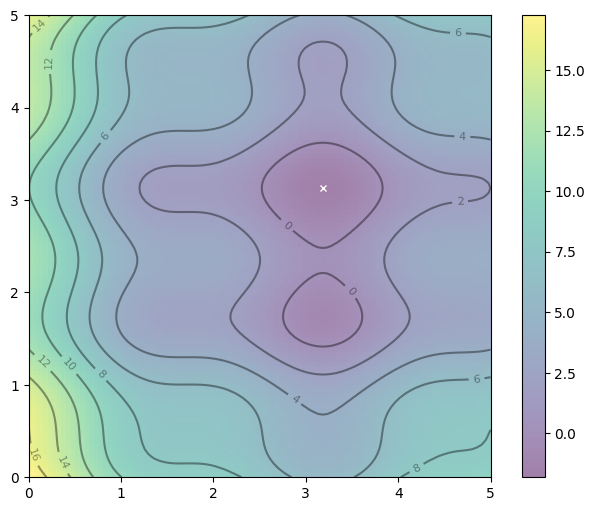

In [6]:
figInicial = plotFunction(x,y,z)

In [7]:
def plotParticles( x, y, z, pbest, X, V ):
    """ Plot the particles in a level picture

    Arguments
    ---------
    x: np.array
        Array of x positions
    y: np.array
        Array of y positions
    z: np.array
        Array of z positions
    pbest: np.array
        Array of best value for particles
    X: np.ndarray
        Multidimensional array with position update
    V: np.ndarray
        Multidimensional array with velocity update

    Return
    ------
    figure
        Figure with the plot of curves
    """
    figY, axY = plt.subplots(figsize=(8,6))
    figY.set_tight_layout(True)
    imgY = axY.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
    figY.colorbar(imgY, ax=axY)
    axY.plot([x_min], [y_min], marker='x', markersize=5, color="white")
    contours = axY.contour(x, y, z, 10, colors='black', alpha=0.4)
    axY.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
    pbest_plot = axY.scatter(pbest[0], pbest[1], marker='o', color='black', alpha=0.5)
    p_plot = axY.scatter(X[0], X[1], marker='o', color='blue', alpha=0.5)
    p_arrow = axY.quiver(X[0], X[1], V[0], V[1], color='blue', width=0.005, angles='xy', scale_units='xy', scale=1)

    return figY, axY

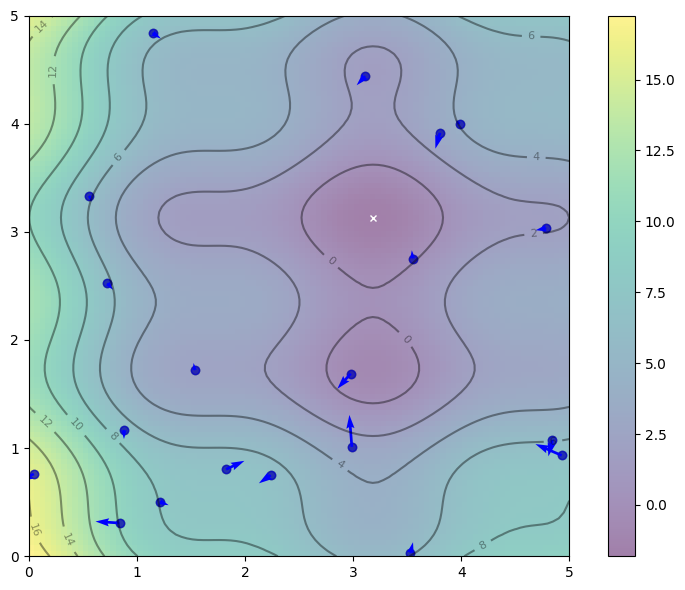

In [8]:
n_particles = 20
X = np.random.rand(2, n_particles) * 5
V = np.random.randn(2, n_particles) * 0.1

# inicializamos el mejor de cada particula en la particula inicial
pbest = X

fig0i, ax0i = plotParticles( x, y, z, pbest, X, V )

Desde aquí se puede "_encontrar_" el $g_{best}$ como la mejor posición para todas las partículas. Como no se han explorado aún, el mejor será la posición de la partícula con el mínimo de todas las partículas  $\min(p_{best}^{i})$

In [9]:
pbest = X
pbest_obj = f(X[0], X[1])
gbest = pbest[:, pbest_obj.argmin()]
gbest_obj = pbest_obj.min()

* El vector $p_{bestObj}$ es el mejor valor de la función objetivo encontrado por cada partícula.
* $g_{bestObj}$ es el mejor valor escalar de la función objetivo encontrada por el enjambre.
* las funciones $\min()$ y $\text{argmin}()$ obtienen el mínimo para el problema de optimización
<br>

Sean $c_1 = c_2 = 0.1$ y $w = 0.8$. Entonces podemos actualizar las posiciones y las velocidades de acuerdo a la fórmula, y después de ello actualizar $p^{i}_{best}$ y $g_{best}$

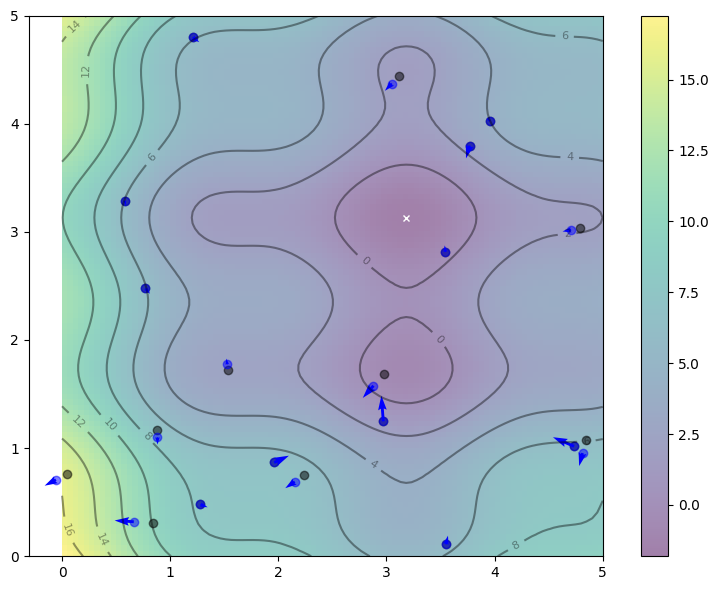

In [10]:
c1 = c2 = 0.1
w = 0.8
# First iteration
r = np.random.rand(2)

V = w * V + c1*r[0]*(pbest - X) + c2*r[1]*(gbest.reshape(-1,1)-X)
X = X + V

obj = f(X[0], X[1])
pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
pbest_obj = np.array([pbest_obj, obj]).max(axis=0)
gbest = pbest[:, pbest_obj.argmin()]
gbest_obj = pbest_obj.min()


fig1i, ax1i = plotParticles( x, y, z, pbest, X, V )

Estado de las partículas y sus respectivas velocidades después de la primer iteración.

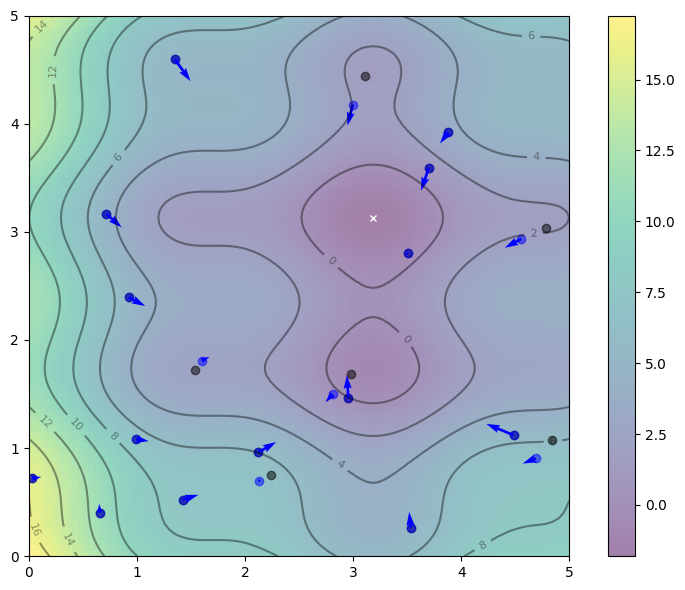

In [11]:
# Second iteration
r = np.random.rand(2)

V = w * V + c1*r[0]*(pbest - X) + c2*r[1]*(gbest.reshape(-1,1)-X)
X = X + V

obj = f(X[0], X[1])
pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
pbest_obj = np.array([pbest_obj, obj]).max(axis=0)
gbest = pbest[:, pbest_obj.argmin()]
gbest_obj = pbest_obj.min()


fig2i, ax2i = plotParticles( x, y, z, pbest, X, V )

Resultado después de la segunda iteración


----
## Iteraciones 3 a 20




In [12]:
def update():
    "Function to do an iteration of particle swarm optimization"
    global V, X, pbest, pbest_obj, gbest, gbest_obj
    # Update params
    r1, r2 = np.random.rand(2)
    V = w * V + c1*r1*(pbest - X) + c2*r2*(gbest.reshape(-1,1)-X)
    X = X + V
    obj = f(X[0], X[1])
    pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
    pbest_obj = np.array([pbest_obj, obj]).min(axis=0)
    gbest = pbest[:, pbest_obj.argmin()]
    gbest_obj = pbest_obj.min()

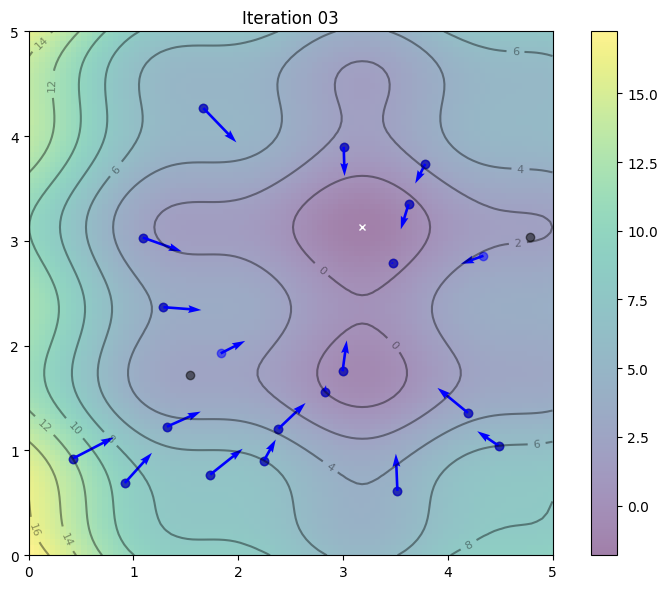

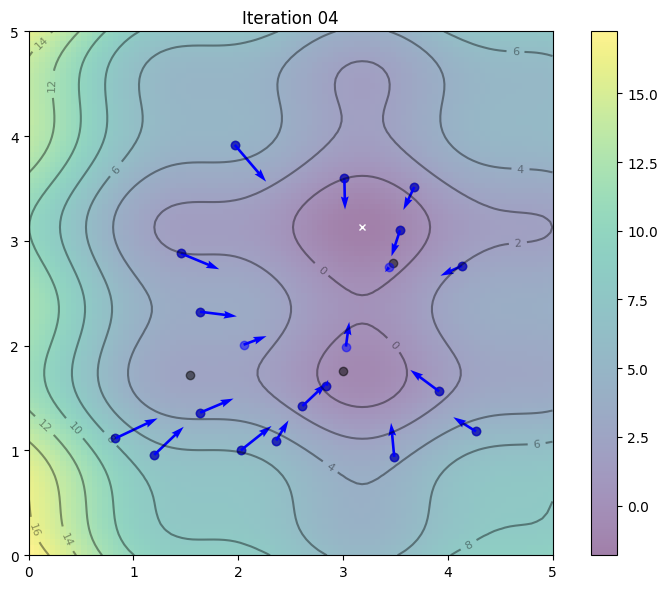

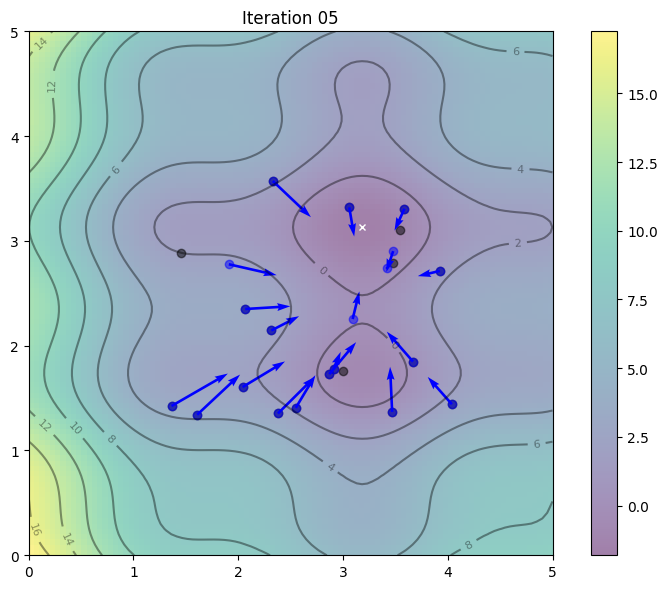

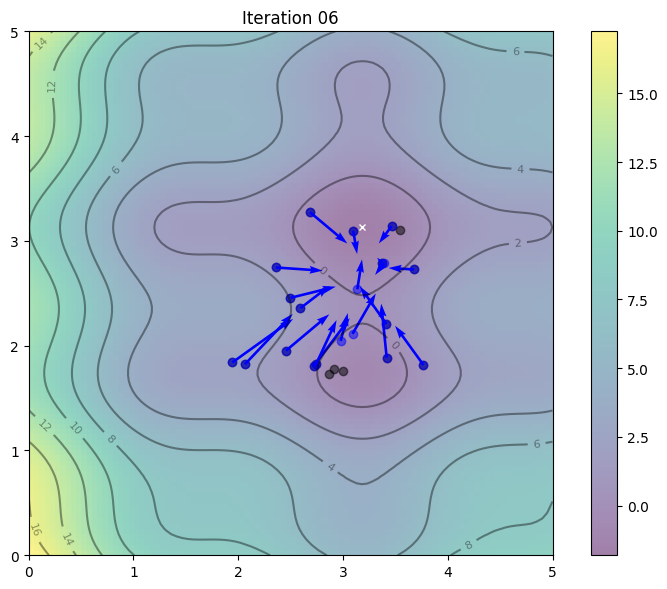

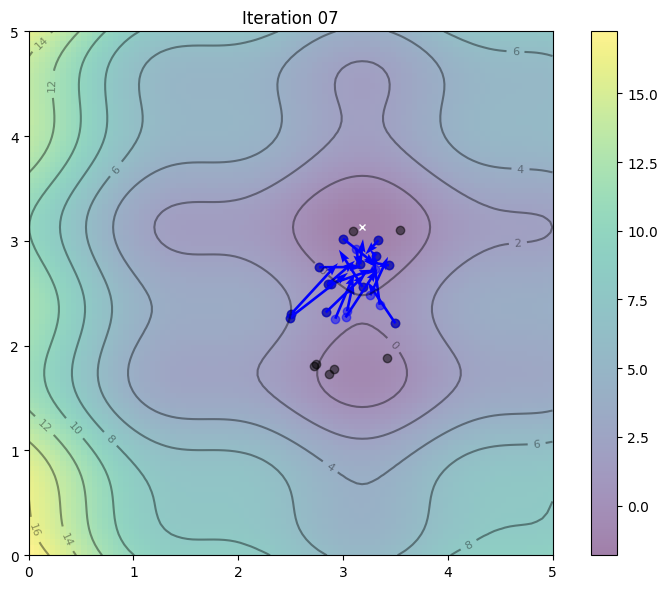

...

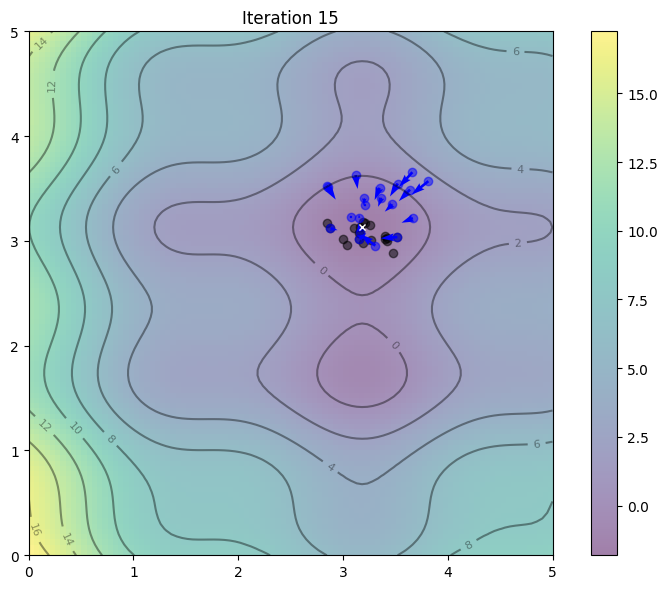

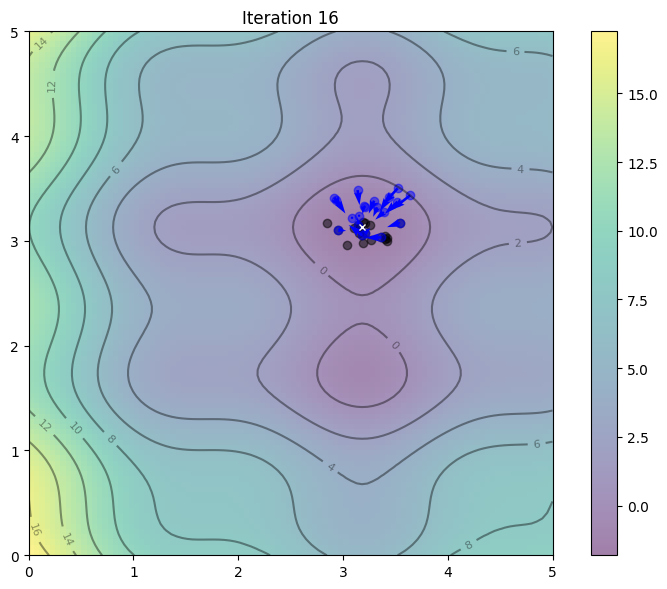

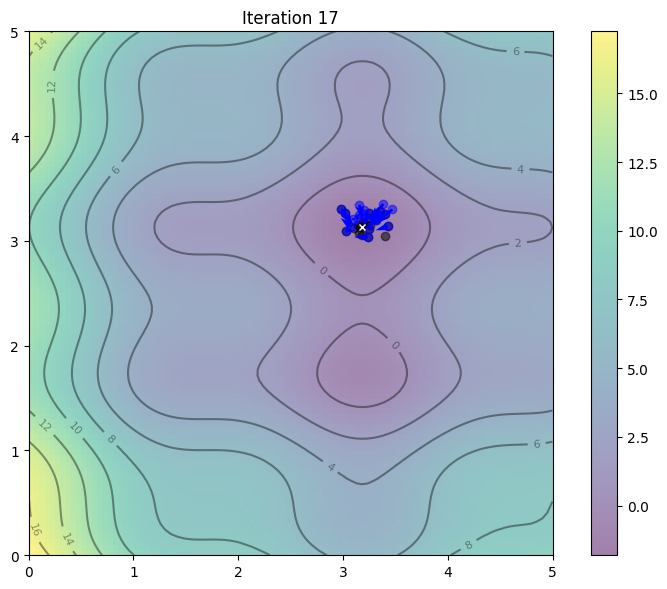

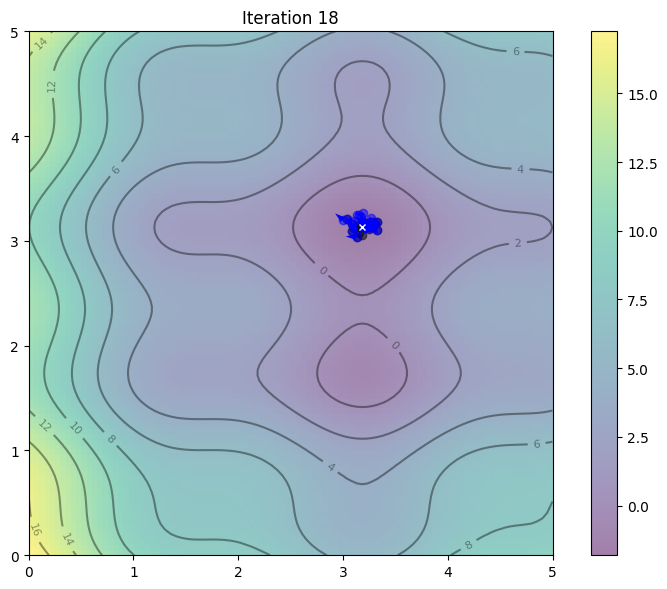

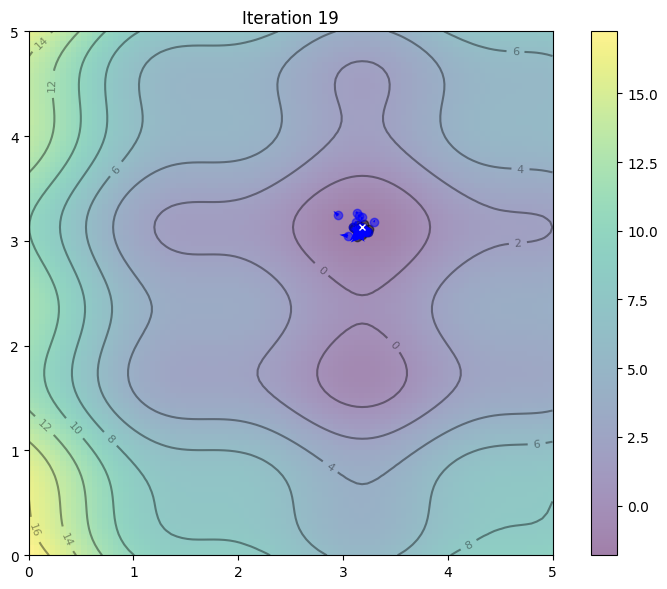

In [13]:
maxIterations = 20
for i in range(3,maxIterations):
    update()
    figIi, axIi = plotParticles( x, y, z, pbest, X, V )
    axIi.set_title('Iteration {:02d}'.format(i))


In [14]:
print("PSO found best solution at f({})={}".format(gbest, gbest_obj))
print("Global optimal at f({})={}".format([x_min,y_min], f(x_min,y_min)))

PSO found best solution at f([3.18680318 3.11914354])=-1.8073365911927994
Global optimal at f([3.1818181818181817, 3.131313131313131])=-1.8082706615747688


1. ¿Qué tan cerca estuvo la solución?
- El resultado final del enjambre depende de múltiples factores, incluidos los valores iniciales de las partículas y los parámetros c1, c2, y w. La proximidad de la solución encontrada por el PSO al óptimo global ([x_min, y_min]) puede variar. La calidad de la solución puede ser evaluada comparando gbest_obj con f(x_min, y_min). Cabe resaltar que en este caso por los resultados obtenidos en esta iteración realmente el error es minimo lo que significa que la solucion estuvo muy cerca

2. ¿Qué pasa si cambiamos los valores de los coeficientes cognitivo y social?
- Aumentar el coeficiente cognitivo (c1) podría llevar a una mejor exploración de soluciones por parte de las partículas individualmente, pero demasiado énfasis en la experiencia personal puede llevar a una exploración ineficiente del espacio de búsqueda. Por otro lado, aumentar el coeficiente social (c2) fomenta la convergencia rápida hacia áreas del espacio de búsqueda que parecen prometedoras, basándose en la experiencia colectiva, pero puede resultar en convergencia prematura a óptimos locales si no se equilibra adecuadamente con la exploración.


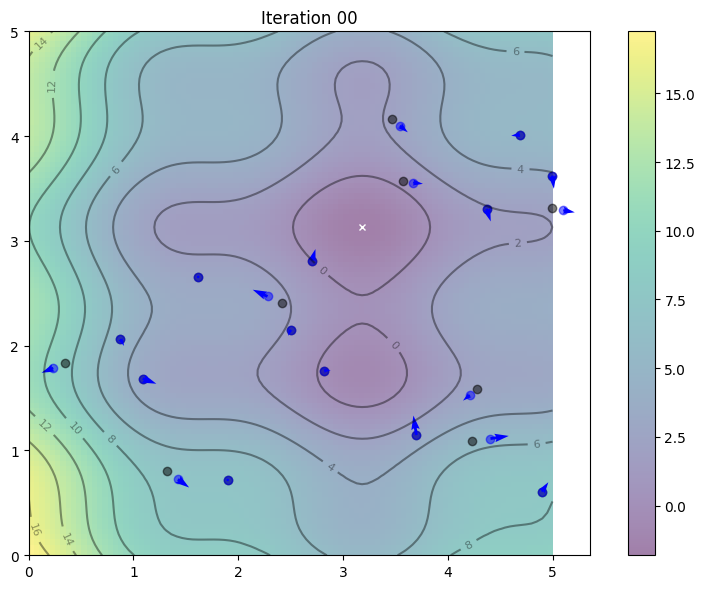

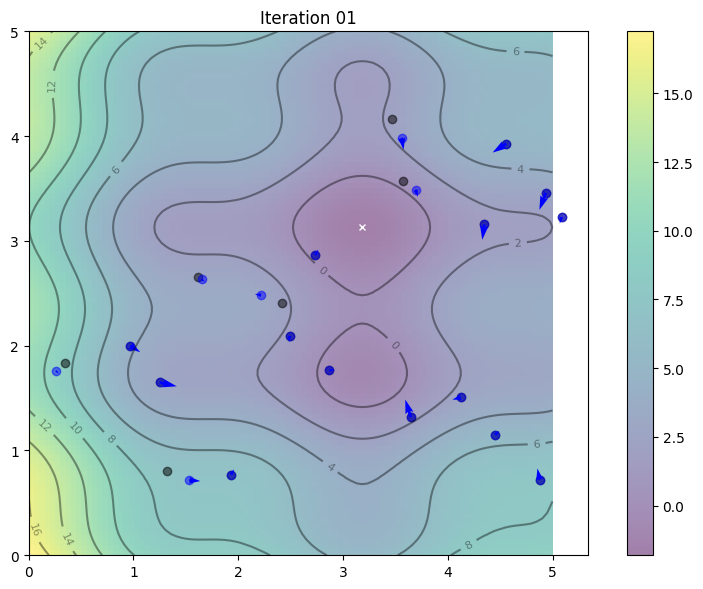

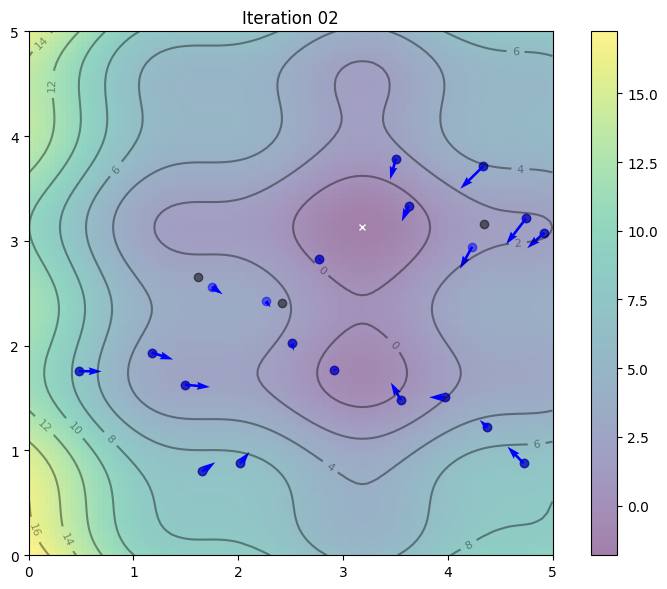

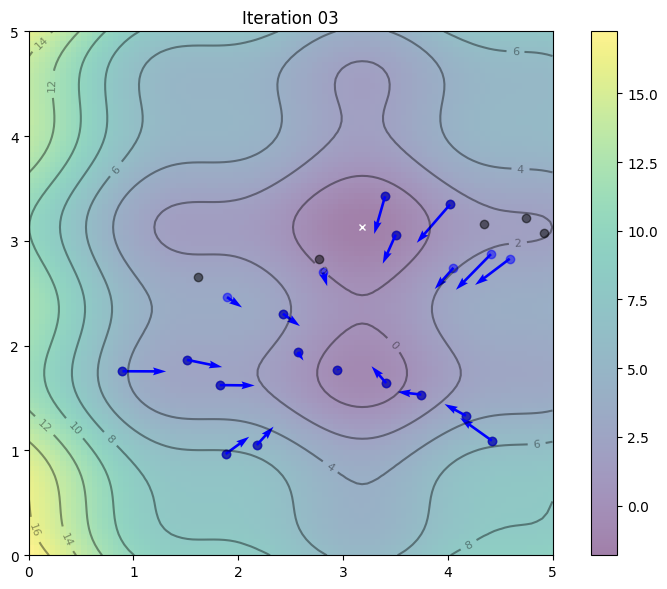

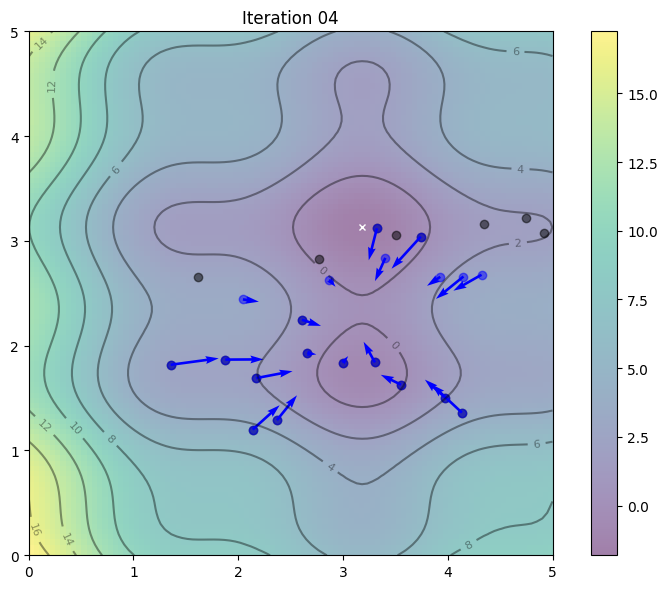

...

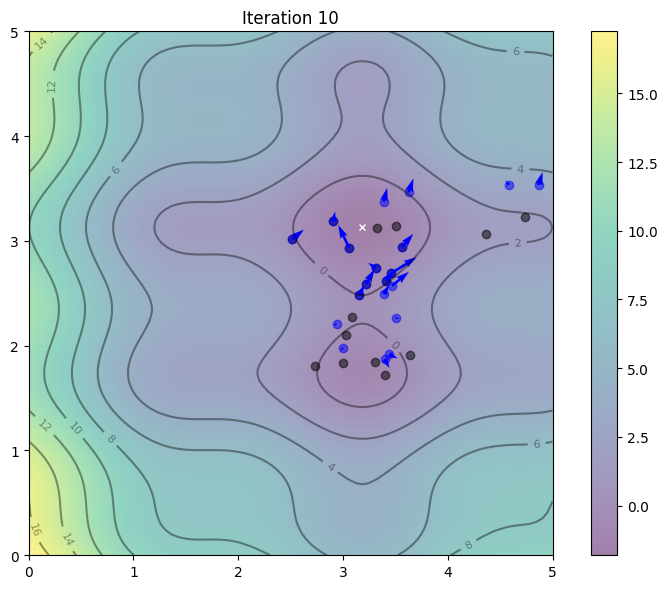

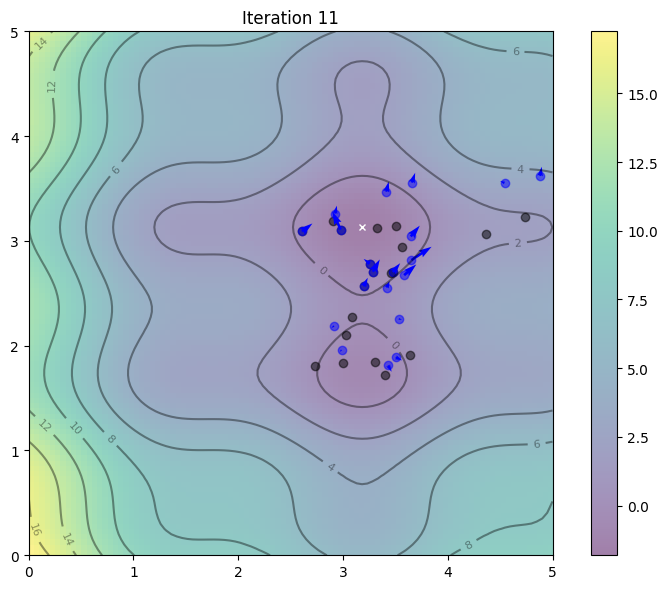

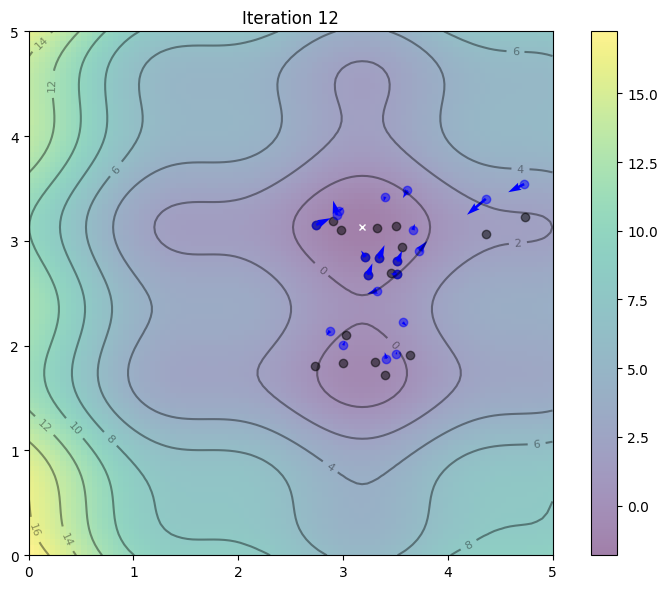

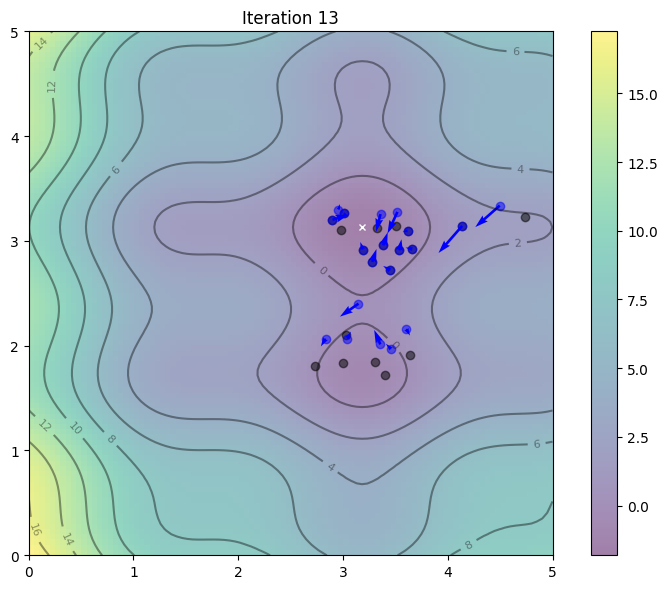

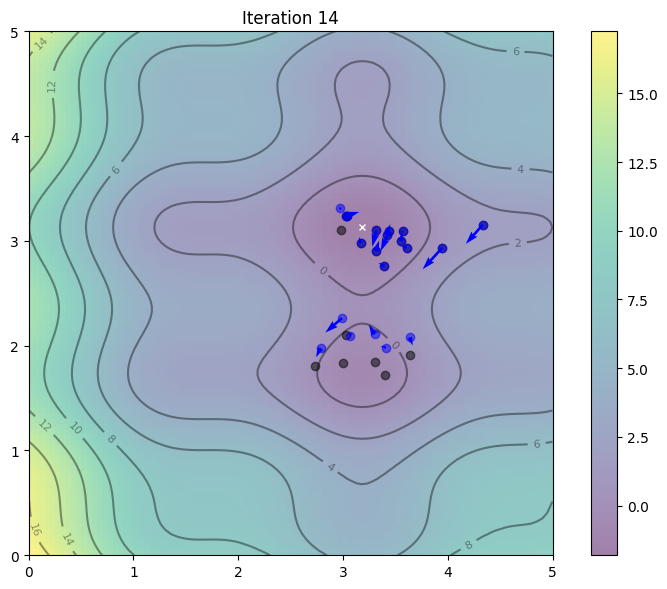

In [19]:
#Prueba 1 con c1 mayor

n_particles1 = 20
X1 = np.random.rand(2, n_particles) * 5
V1 = np.random.randn(2, n_particles) * 0.1
pbest1 = X1
pbest_obj1 = f(X1[0], X1[1])
gbest1 = pbest1[:, pbest_obj1.argmin()]
gbest_obj1 = pbest_obj1.min()

c1_1 = 0.5  # Aumentado de 0.1 a 0.5
c2_1 = 0.1
w_1 = 0.8
def update1():
    "Function to do an iteration of particle swarm optimization"
    global V1, X1, pbest1, pbest_obj1, gbest1, gbest_obj1
    # Update params
    r1, r2 = np.random.rand(2)

    V1 = w_1 * V1 + c1_1*r1*(pbest1 - X1) + c2_1*r2*(gbest1.reshape(-1,1)-X1)
    X1 = X1 + V1

    obj1 = f(X1[0], X1[1])
    pbest1[:, (pbest_obj1 >= obj1)] = X1[:, (pbest_obj1 >= obj1)]
    pbest_obj1 = np.array([pbest_obj1, obj1]).min(axis=0)
    gbest1 = pbest1[:, pbest_obj1.argmin()]
    gbest_obj1 = pbest_obj1.min()


maxIterations = 15
for i in range(0,maxIterations):
    update1()
    figIi, axIi = plotParticles( x, y, z, pbest1, X1, V1 )
    axIi.set_title('Iteration {:02d}'.format(i))


Como podemos notar en este ultimo resultado las particulas no tardaron en encontrar el minimo global y sin embargo algunas se quedaron estancadas en el minimo local precisamente por su experiencia personal.

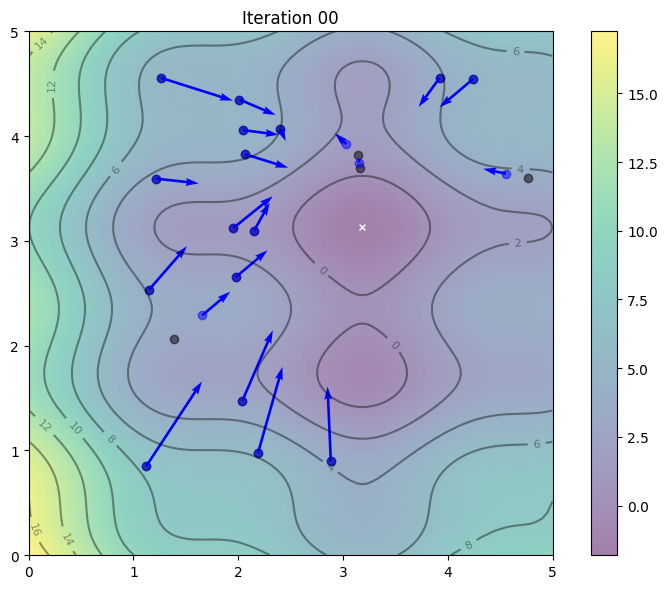

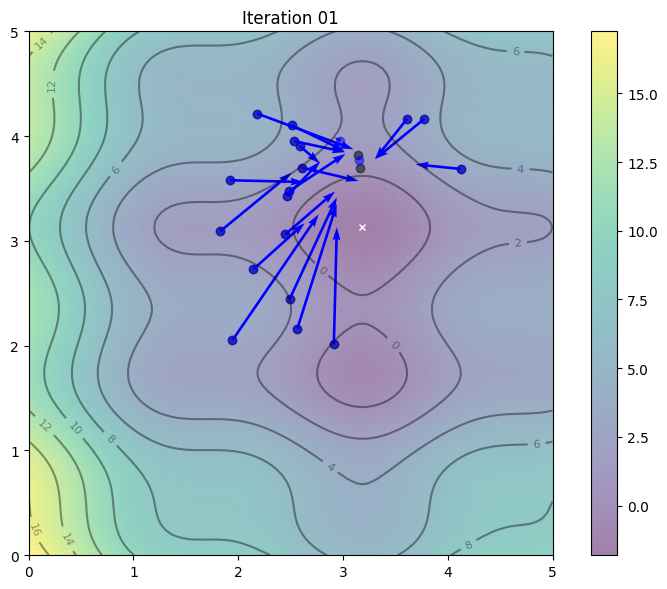

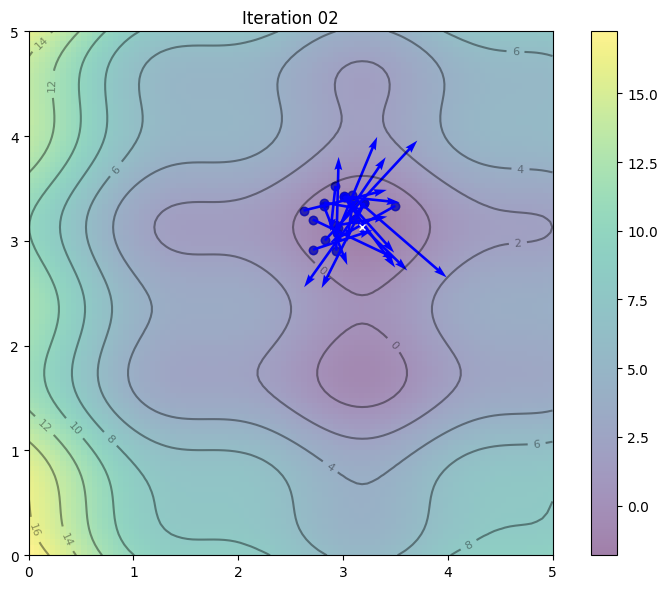

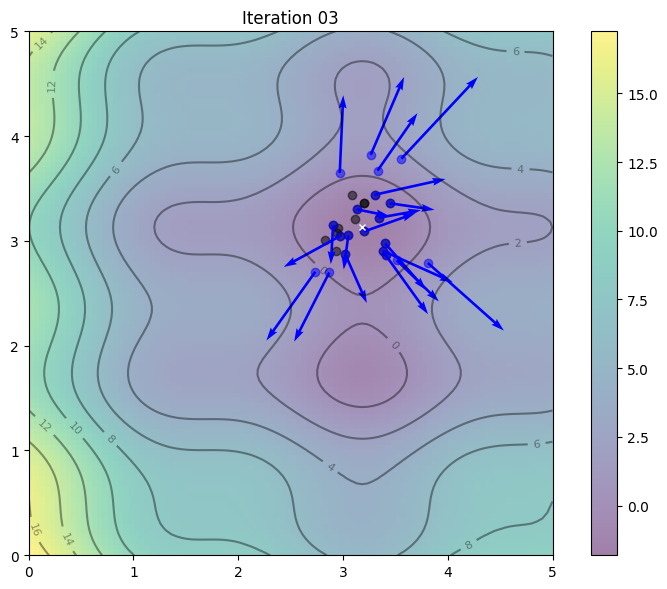

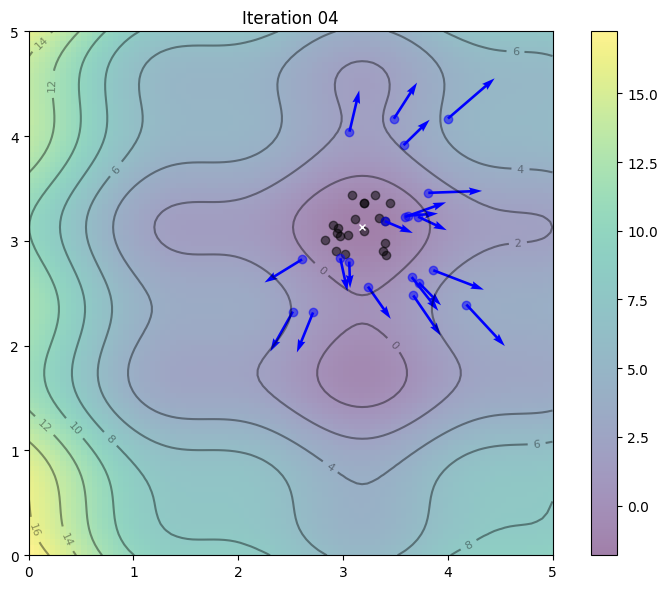

...

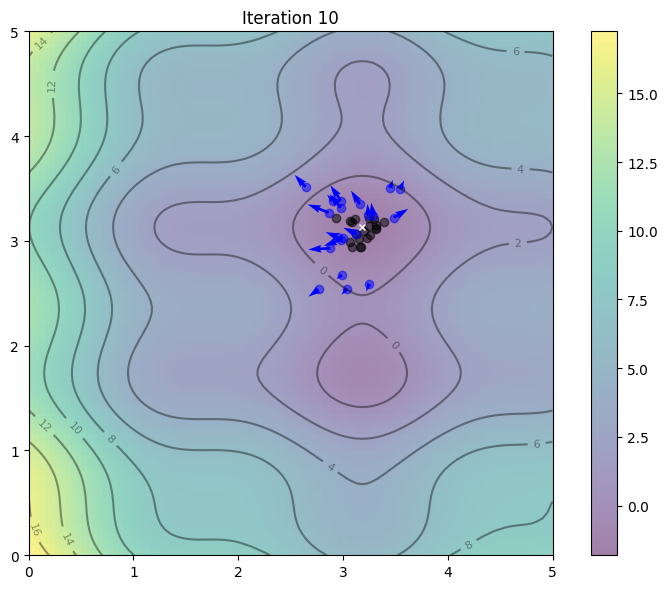

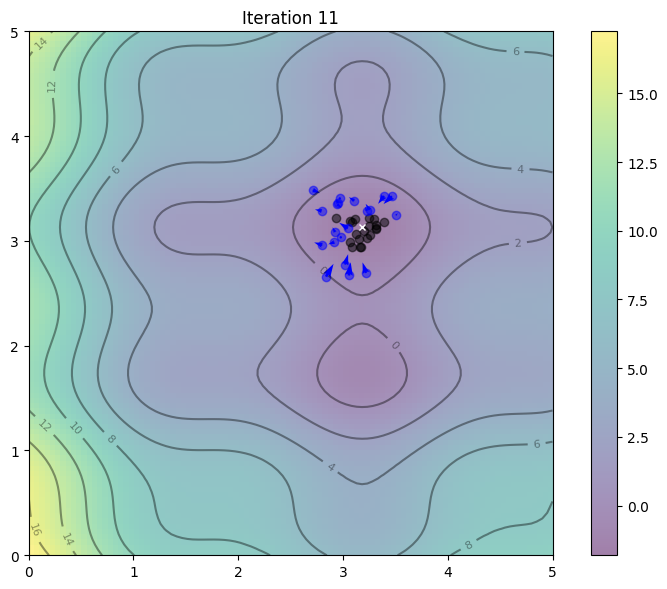

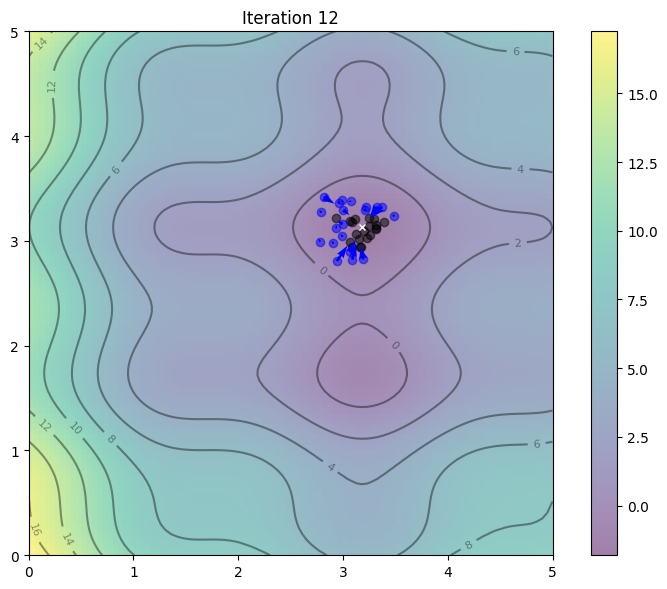

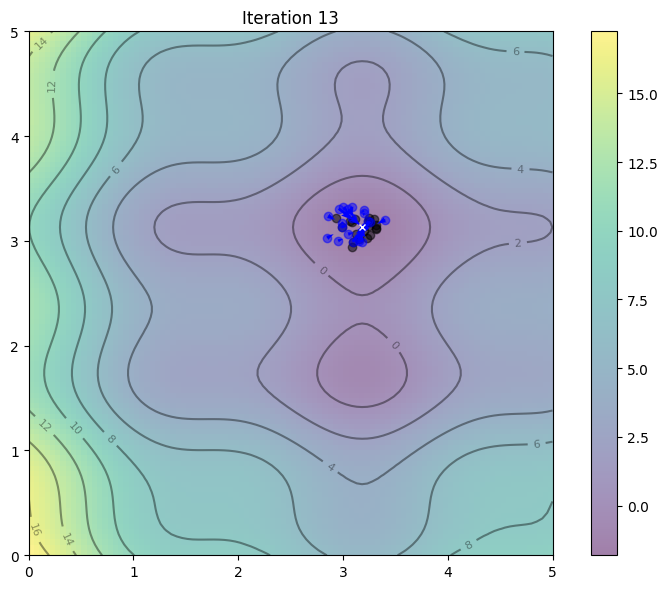

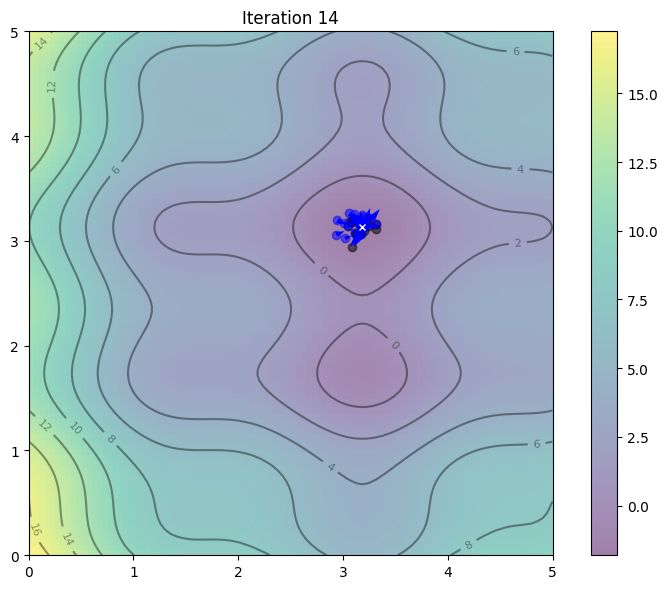

In [20]:
#Prueba 2 con c2 mayor
n_particles1 = 10
X1 = np.random.rand(2, n_particles) * 5
V1 = np.random.randn(2, n_particles) * 0.1
pbest1 = X1
pbest_obj1 = f(X1[0], X1[1])
gbest1 = pbest1[:, pbest_obj1.argmin()]
gbest_obj1 = pbest_obj1.min()

c1_1 = 0.1
c2_1 = 0.5  # Aumentado de 0.1 a 0.5
w_1 = 0.8

maxIterations = 15
for i in range(0,maxIterations):
    update1()
    figIi, axIi = plotParticles( x, y, z, pbest1, X1, V1 )
    axIi.set_title('Iteration {:02d}'.format(i))

En este segundo caso al aumentar el coeficiente social (c2) podemos apreciar que muchas veces las particulas encontraban la solucion pero a pesar de esto en ocasiones volvian a desviarse del minimo global

3. ¿Qué pasa si cambiamos la constante de inercia?
- Reducir la constante de inercia (w) puede ayudar a estabilizar el enjambre y favorecer la explotación de las áreas ya descubiertas del espacio de búsqueda, potencialmente mejorando la precisión de la solución encontrada. Por otro lado, aumentar w favorece la exploración del espacio de búsqueda, lo que puede ser útil para evitar óptimos locales pero también puede disminuir la precisión de la convergencia.

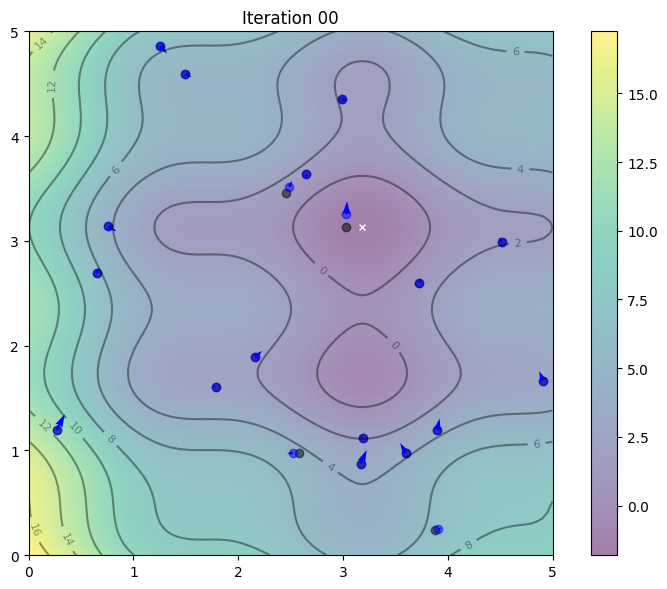

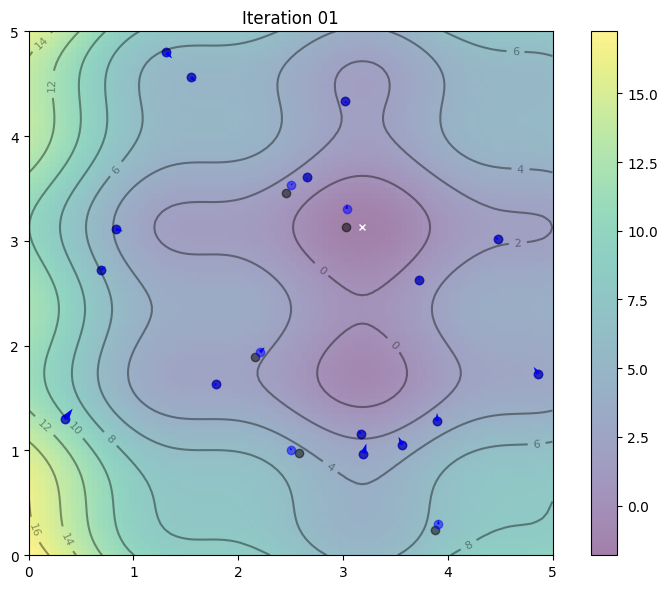

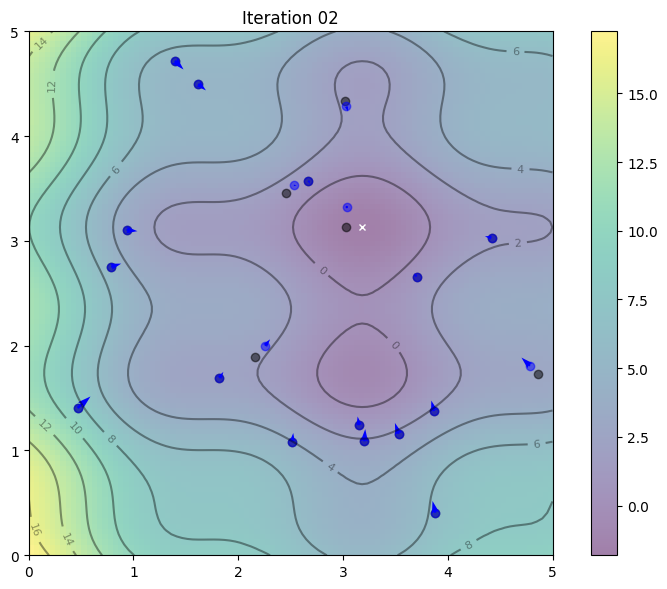

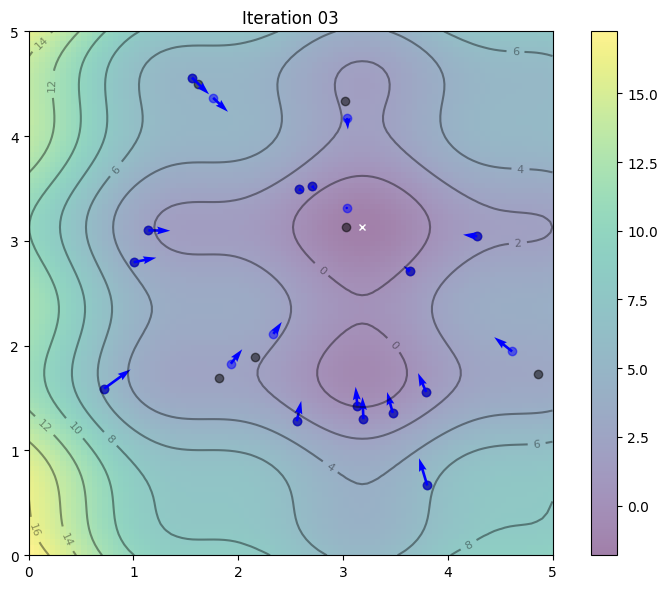

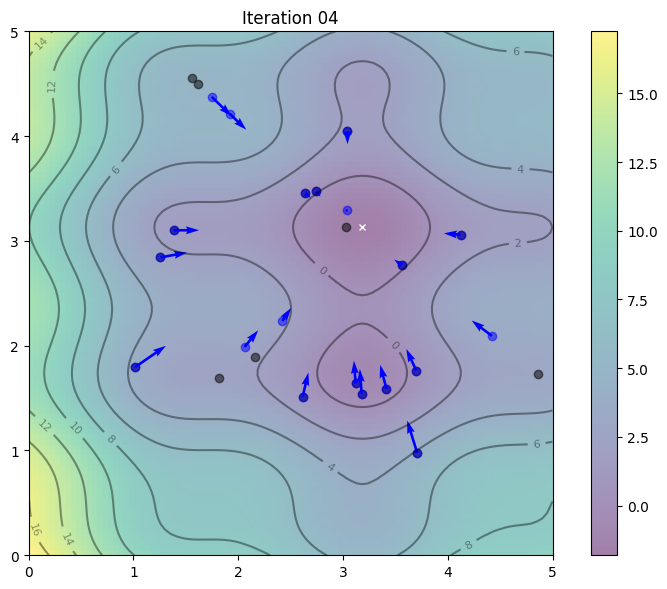

...

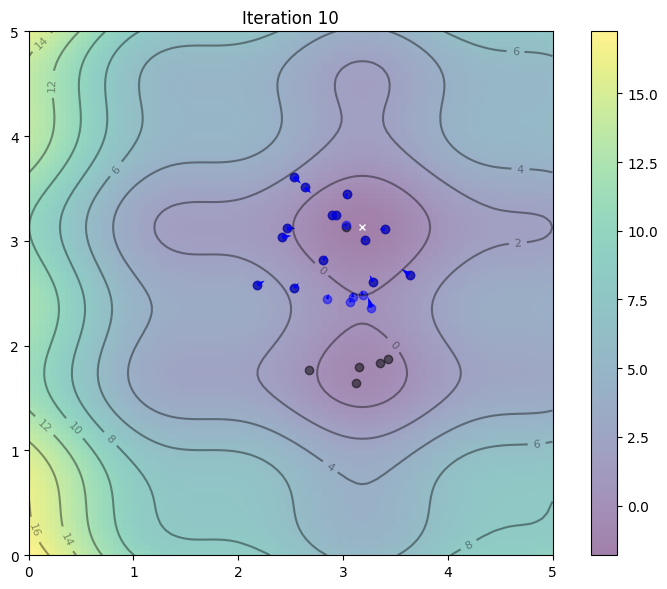

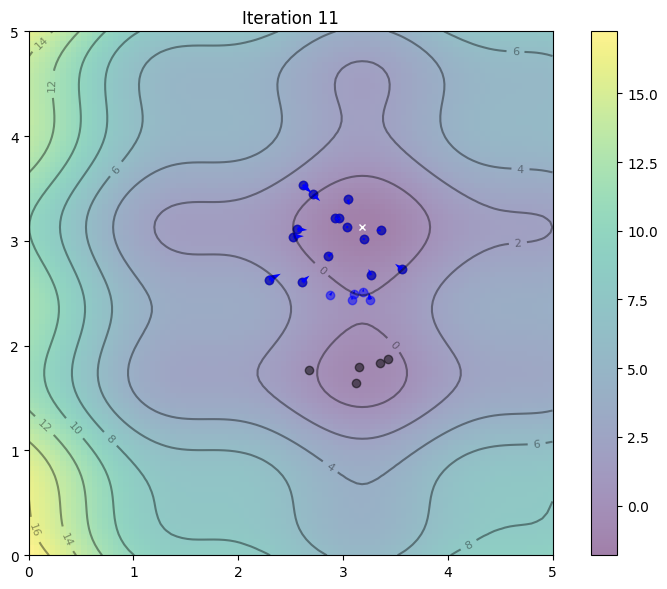

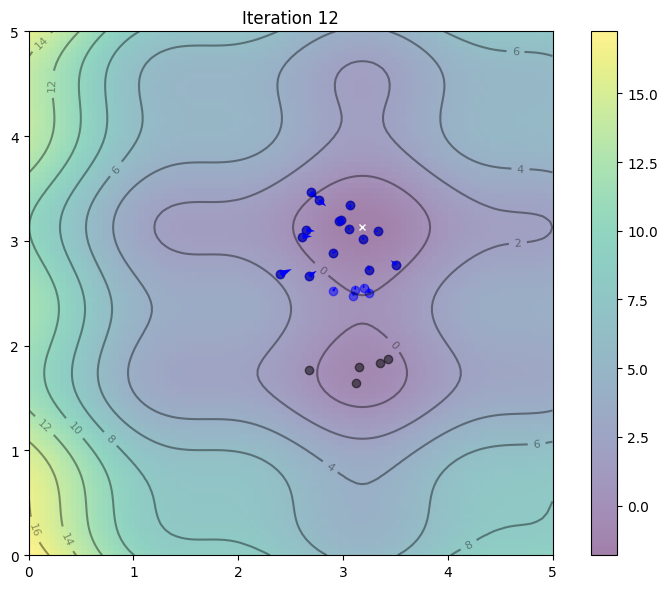

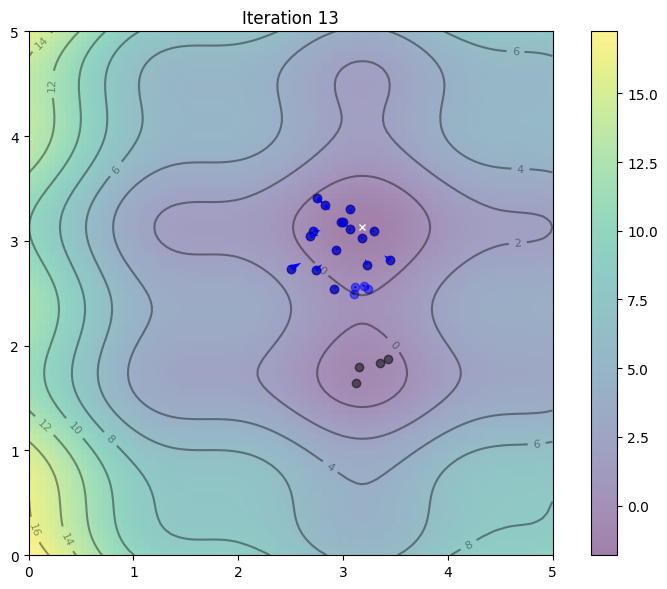

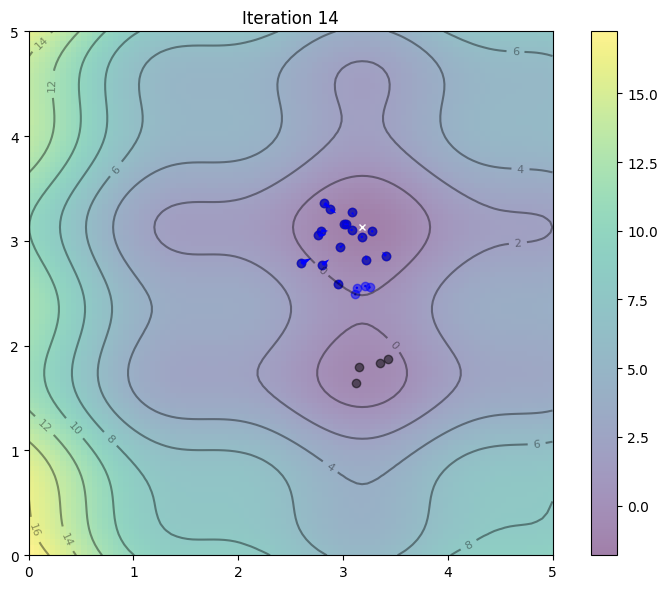

In [22]:
#Prueba con w menor
n_particles1 = 10
X1 = np.random.rand(2, n_particles) * 5
V1 = np.random.randn(2, n_particles) * 0.1
pbest1 = X1
pbest_obj1 = f(X1[0], X1[1])
gbest1 = pbest1[:, pbest_obj1.argmin()]
gbest_obj1 = pbest_obj1.min()

c1_1 = 0.1
c2_1 = 0.1  # Aumentado de 0.1 a 0.5
w_1 = 0.5

maxIterations = 15
for i in range(0,maxIterations):
    update1()
    figIi, axIi = plotParticles( x, y, z, pbest1, X1, V1 )
    axIi.set_title('Iteration {:02d}'.format(i))

Modificar el valor de w depende mucho de la posicion de las particulas ya que un w menor si bien, puede favorecer en una mejor precision durante la busqueda, puede pasar tambien que al ser muy pequeño se quede estancado en un minimo local

#NOTA:

* Con mas numero de iteraciones en cada prueba los resultados se aprecian mejor, sin embargo al poner mas iteraciones en cada prueba el tamaño del documento superaba las 10MB permitidas en la entrega
